In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'
import arfit.ar1_kalman as ar1
import arfit.carma_pack_posterior as cpp
from arfit.run_carma_pack_posterior import LL, LP
import bz2
import carmcmc as cm
import emcee
import h5py
import kombine
import os
import pickle
import plotutils.autocorr as ac
import plotutils.plotutils as pu
import plotutils.runner as pr
import scipy.optimize as so
import scipy.signal as ss
import triangle

Populating the interactive namespace from numpy and matplotlib


## Load the data

<Container object of 3 artists>

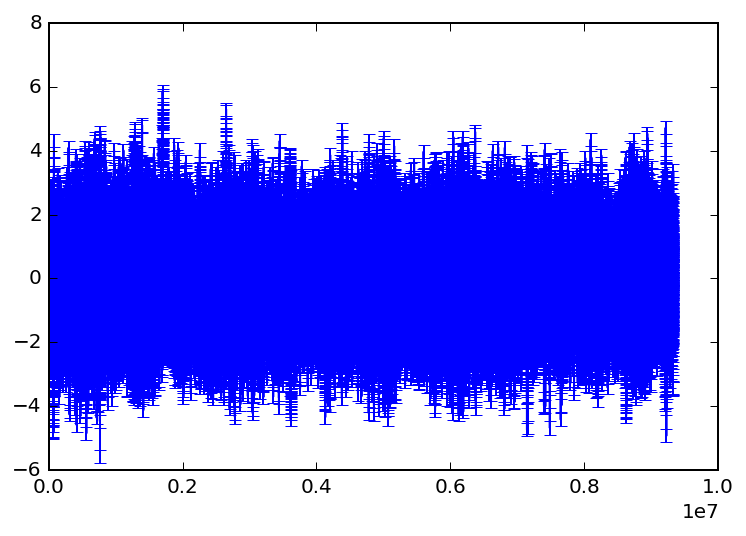

In [2]:
with h5py.File('time_vel.hdf5', 'r') as inp:
    data = column_stack((inp['time'][:], inp['vel'][:], inp['dvel'][:]))
errorbar(data[:,0], data[:,1], data[:,2])

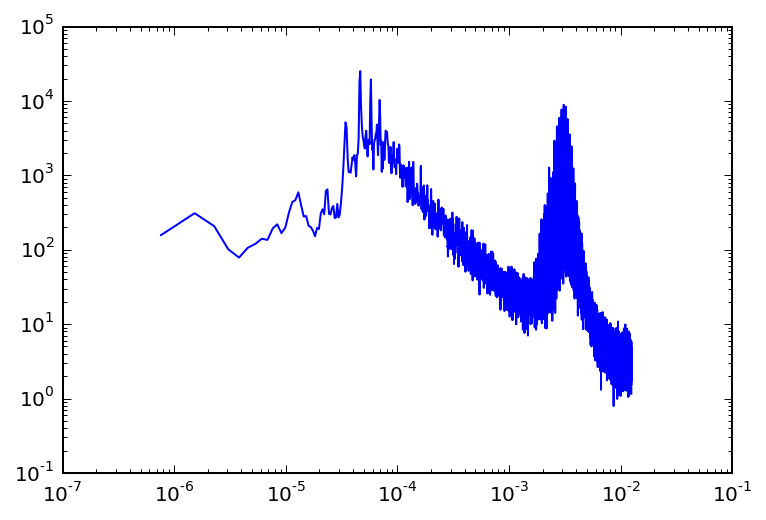

In [3]:
T = data[-1,0] - data[0,0]
dt = data[1,0] - data[0,0]
bw = 1.0/(2*dt)
nperseg = 32768
fs, psd = ss.welch(data[:,1], fs=1/dt,nperseg=nperseg)
loglog(fs, psd)

In [4]:
sel = ~(data[:,1]==0.0)

## White Noise Addition

In [708]:
med_psd = median(psd[-100:])
df = fs[1] - fs[0]
wn_var = med_psd * fs[-1]
wn_sigma = sqrt(wn_var)
print wn_sigma, data[0,1]

0.205587206269 2.3966141


In [713]:
with h5py.File('time_vel.hdf5.temp', 'w') as out:
    out.create_dataset('time', data=data[:,0], compression='gzip')
    out.create_dataset('vel', data=data[:,1], compression='gzip')
    out.create_dataset('dvel', data=wn_sigma + 0*data[:,1], compression='gzip')
os.rename('time_vel.hdf5.temp', 'time_vel.hdf5')

## AR(1) Fits

In [ ]:
logpost = ar1.AR1KalmanPosterior(data[sel, 0], data[sel,1], 0*data[sel,1])

In [5]:
nwalkers = 128
sampler = emcee.EnsembleSampler(nwalkers, logpost.nparams, logpost)

In [6]:
pguess = logpost.parameterise(mean(logpost.y), std(logpost.y), 1.0/5e-5, 0.11)
result = sampler.run_mcmc(pguess + 1e-3*randn(nwalkers, logpost.nparams), 100)
pbest = result[0][argmax(result[1]), :]

Optimization terminated successfully.
         Current function value: 236851.671402
         Iterations: 2
         Function evaluations: 100


In [45]:
#pinit = pbest + 1e-3*randn(nwalkers, logpost.nparams)
#runner = pr.EnsembleSamplerRunner(sampler, pinit)
runner.run_to_neff(128, savedir='.')
#runner.run_mcmc(128)
#runner.save_state('.')

Accumulated  256  ensembles, acceptance rate is  0.603240966797
Saving state...
Accumulated  384  ensembles, acceptance rate is  0.602274576823
Equivalent to  14  effective ensembles
Saving state...
Accumulated  512  ensembles, acceptance rate is  0.601486206055
Saving state...
emcee: Exception while calling your likelihood function:
  params: [ -1.01110839e-02  -2.30192038e+00  -1.34147465e+01   3.52031420e+00]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/Users/farr/Library/Enthought/Canopy_64bit/User/lib/python2.7/site-packages/emcee-2.1.0-py2.7.egg/emcee/ensemble.py", line 505, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "/Users/farr/Documents/Research/GaussianNoiseModeling/code/arfit/ar1_kalman.py", line 149, in __call__
    return self.log_likelihood(p) + lp
  File "/Users/farr/Documents/Research/GaussianNoiseModeling/code/arfit/ar1_kalman.py", line 141, in log_likelihood
    return -0.5*chi2 - 0.5*self.y.shape[0]*np.log(2*np.pi) - 0.5*np.sum(np.log(vyp))
KeyboardInterrupt


KeyboardInterrupt: 

In [46]:
runner.load_state('.')

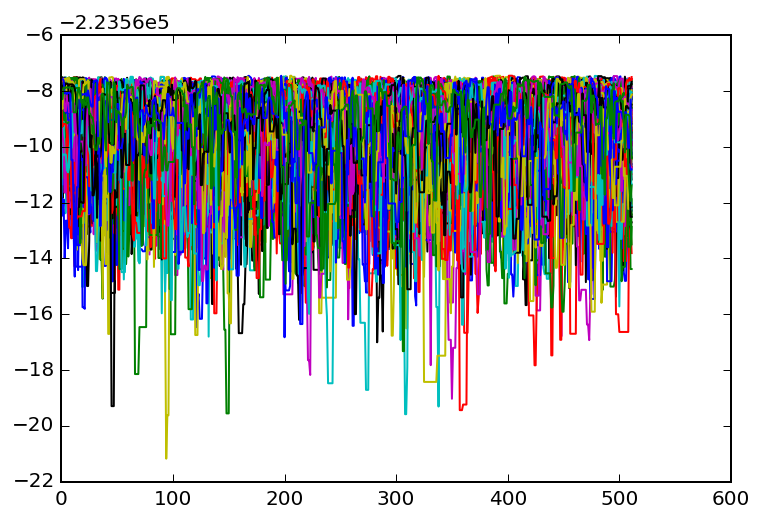

In [47]:
plot(runner.sampler.lnprobability.T); None

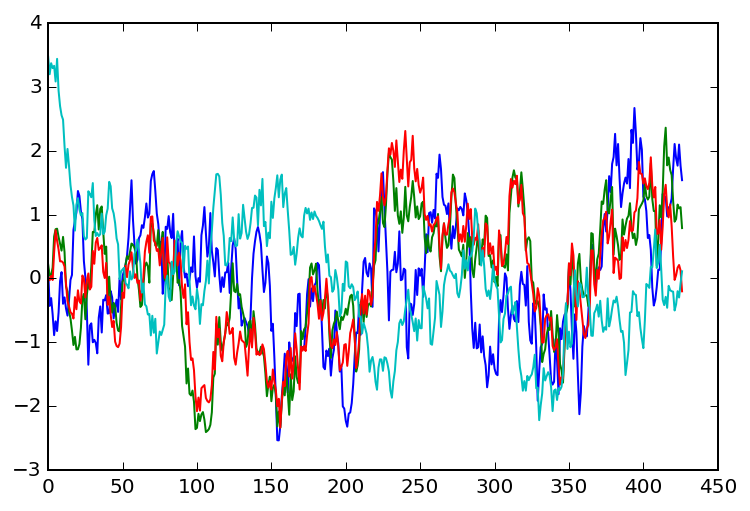

In [48]:
pu.plot_emcee_chains_one_fig(runner.burnedin_chain)

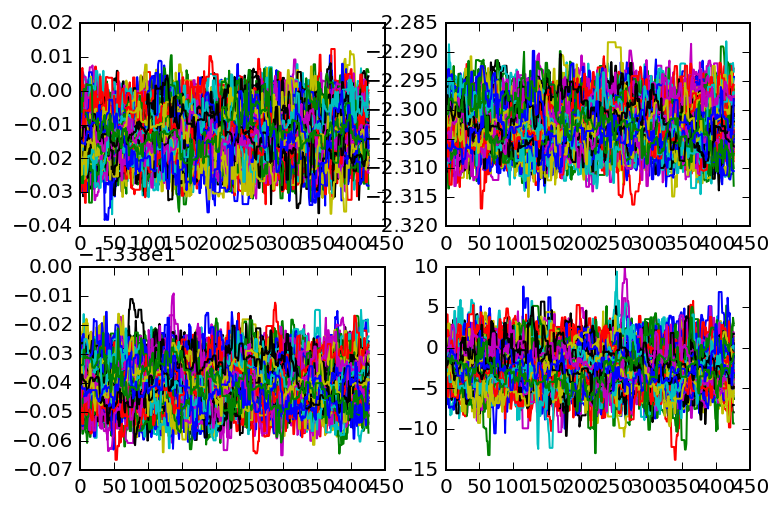

In [49]:
pu.plot_emcee_chains(runner.burnedin_chain, mean=False)

Quantiles:
[(0.05, -0.023370201264250261), (0.16, -0.018983740322817105), (0.5, -0.012241601897282935), (0.84, -0.0056174301608370308), (0.95, -0.001443859959791498)]
Quantiles:
[(0.05, 1.1031635148331502), (0.16, 1.1052959957889112), (0.5, 1.1084685680724031), (0.84, 1.1117837481308048), (0.95, 1.1139895034604237)]
Quantiles:
[(0.05, 140.99506530958465), (0.16, 141.61122275322944), (0.5, 142.5678907358643), (0.84, 143.54101826906026), (0.95, 144.15168746889444)]
Quantiles:
[(0.05, 0.12924023083557992), (0.16, 0.21552809091507988), (0.5, 0.95719645004306186), (0.84, 4.5259218603076254), (0.95, 7.857403081839677)]


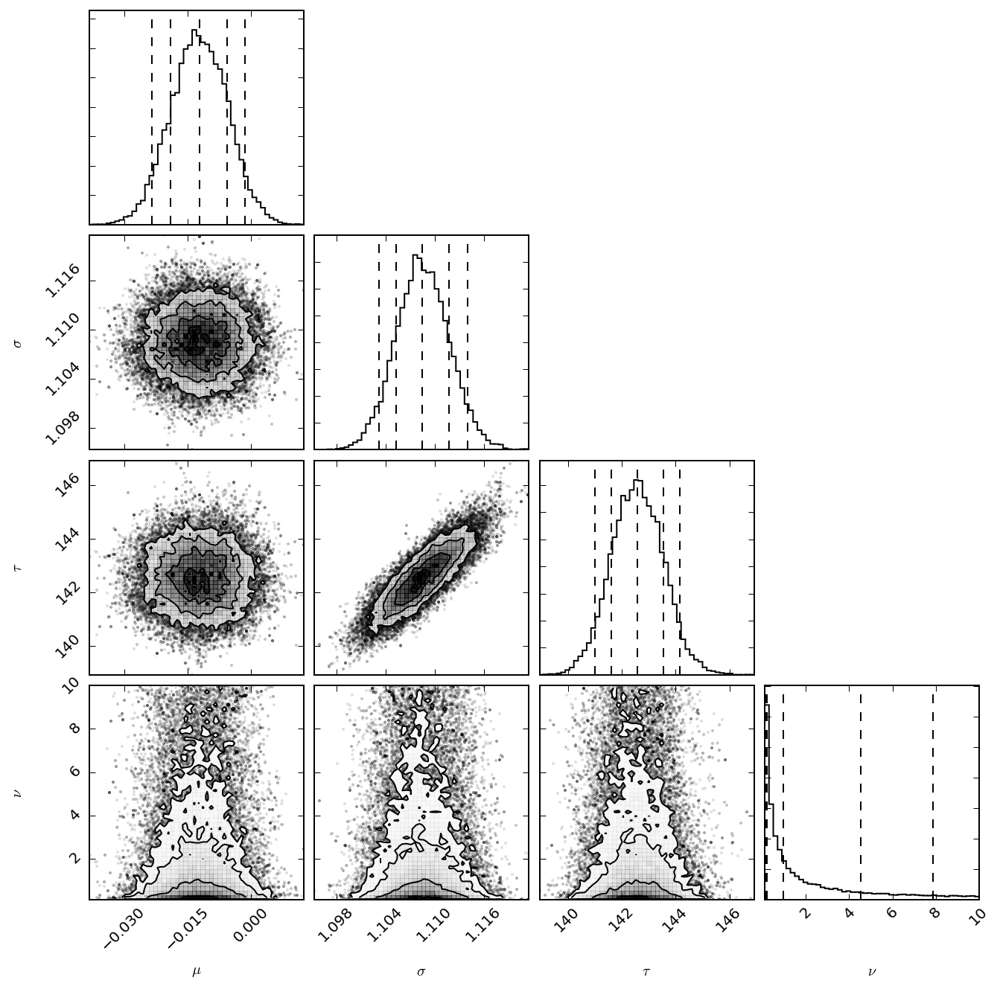

In [52]:
pars = []
for p in runner.burnedin_chain.reshape((-1, logpost.nparams)):
    pars.append(logpost.deparameterise(p))
pars = np.array(pars)
triangle.corner(pars, quantiles=[0.05, 0.16, 0.5, 0.84, 0.95], labels=[r'$\mu$', r'$\sigma$', r'$\tau$', r'$\nu$'])
None

In [53]:
resid = 0
N=1000
for p in permutation(runner.burnedin_chain.reshape((-1, logpost.nparams)))[:N,:]:
    resid += logpost.y - logpost.predict(p)[0]
resid /= N
full_resid = zeros(data.shape[0])
full_resid[sel] = resid

In [54]:
rfs, rpsd = ss.welch(full_resid, fs=1/dt, nperseg=4096)

In [58]:
tpsd = 0
for p in permutation(runner.burnedin_chain.reshape((-1, logpost.nparams)))[:N,:]:
    tpsd += logpost.power_spectrum(p, rfs)
tpsd /= N

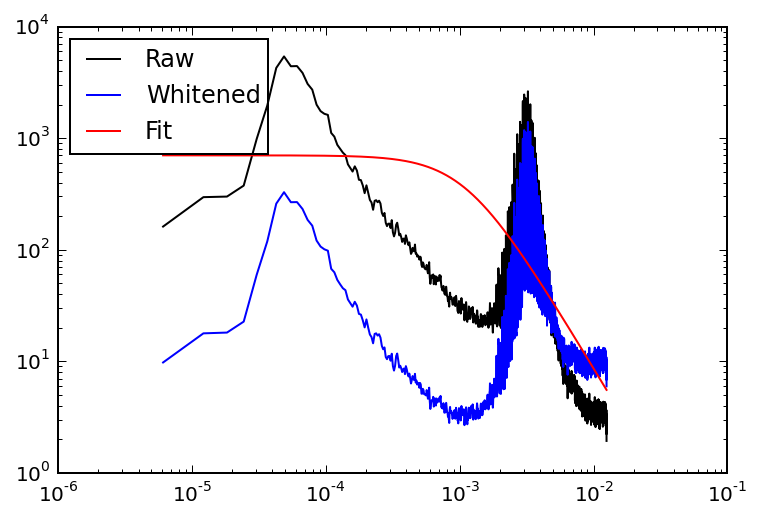

In [59]:
loglog(fs, psd, '-k', label='Raw')
loglog(rfs, rpsd, '-b', label='Whitened')
loglog(rfs, tpsd, '-r', label='Fit')
legend(loc='upper left')

In [61]:
with h5py.File('whitened_time_vel.hdf5', 'w') as out:
    out.create_dataset('time', compression='gzip', data=data[:,0])
    out.create_dataset('vel', compression='gzip', data=data[:,1])
    out.create_dataset('white_vel', compression='gzip', data=full_resid)
    out.create_dataset('posterior_samples', compression='gzip', data=pars)
    
    out['posterior_samples'].attrs['par_names'] = ['mu', 'sigma', 'tau', 'nu']

## ``emcee`` Using ``carma_pack``

Let's first try fitting the first $N$ samples from the data, increasing $N$ slowly.

In [5]:
N = 131072 # No longer used.

In [159]:
with open('time_vel.txt', 'w') as out:
    savetxt(out, data[sel, :])

In [5]:
!./pull.sh

Saving password to keychain failed
Identity added: /Users/farr/.ssh/id_dsa (/Users/farr/.ssh/id_dsa)
receiving file list ... done
./
p06q05/
p06q05/chain.npy.bz2
p06q05/lnprob.npy.bz2
p06q05/p06q05.log
p06q05/p06q05.out
p06q05/runner.pkl.bz2
p06q05/thin.txt

sent 25163 bytes  received 8302825 bytes  616888.00 bytes/sec
total size is 25724035  speedup is 3.09


In [21]:
with bz2.BZ2File('p06q05/runner.pkl.bz2', 'r') as inp:
    runner = pickle.load(inp)

In [19]:
pu.plot_histogram_posterior(lnps)

OverflowError: cannot convert float infinity to integer

In [18]:
mean(runner.sampler.acceptance_fraction)

0.1690029568142361

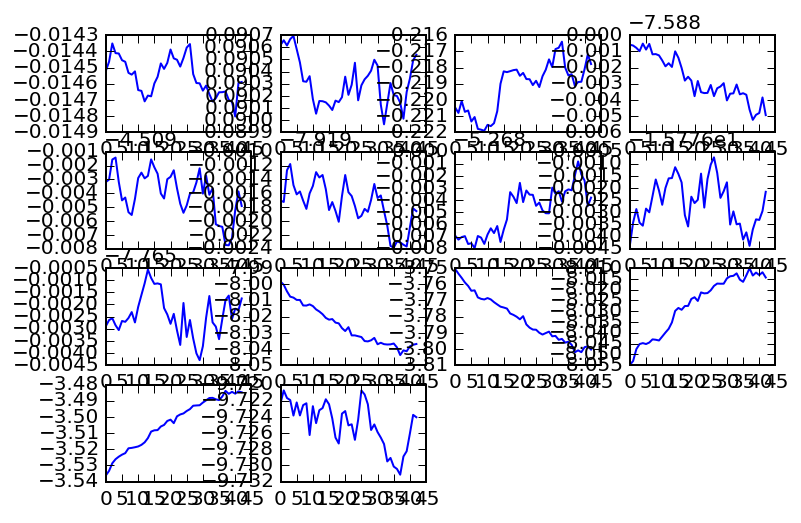

In [8]:
pu.plot_emcee_chains(runner.burnedin_chain)

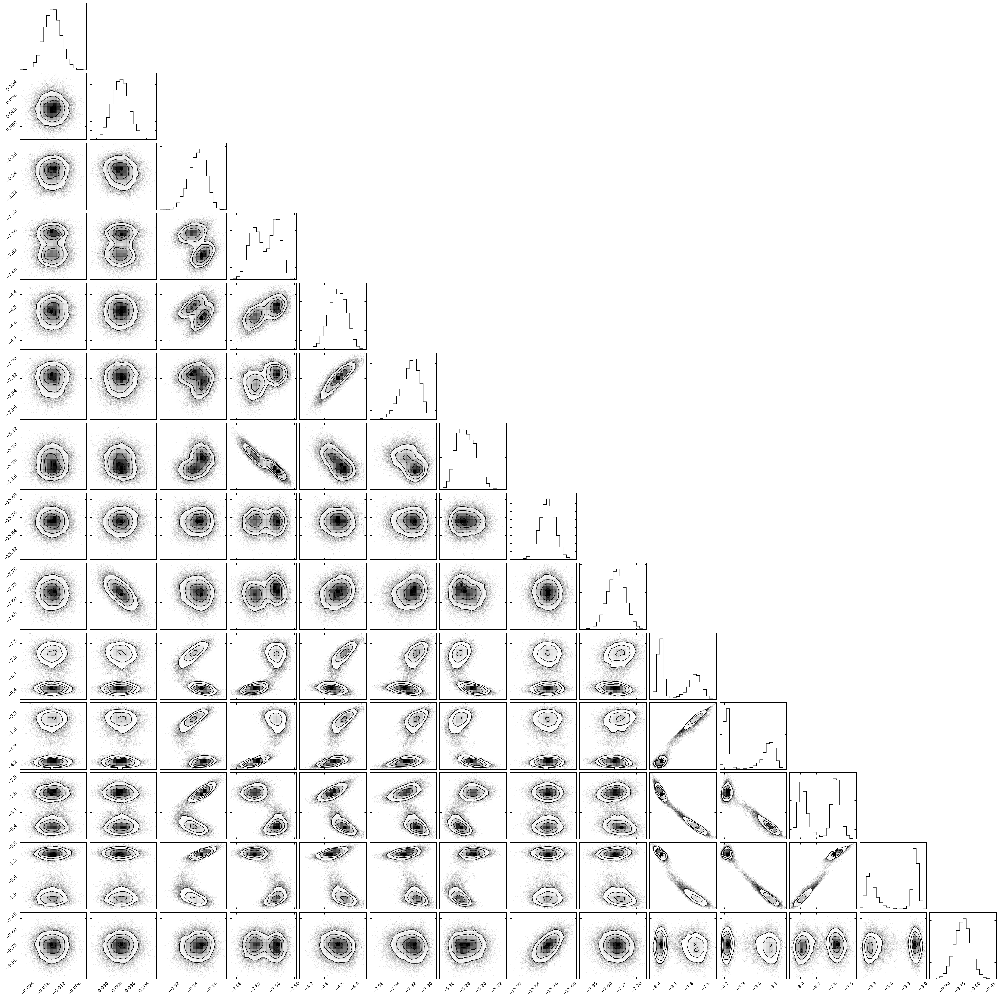

In [9]:
triangle.corner(runner.burnedin_chain.reshape((-1, runner.sampler.lnprobfn.f.nparams))); None

In [10]:
ac.emcee_chain_autocorrelation_lengths(runner.chain)

array([ 1.81318681,  1.9023789 ,         nan,         nan,         nan,
               nan,         nan,  2.30282027,  2.19683707,         nan,
               nan,         nan,         nan,         nan])

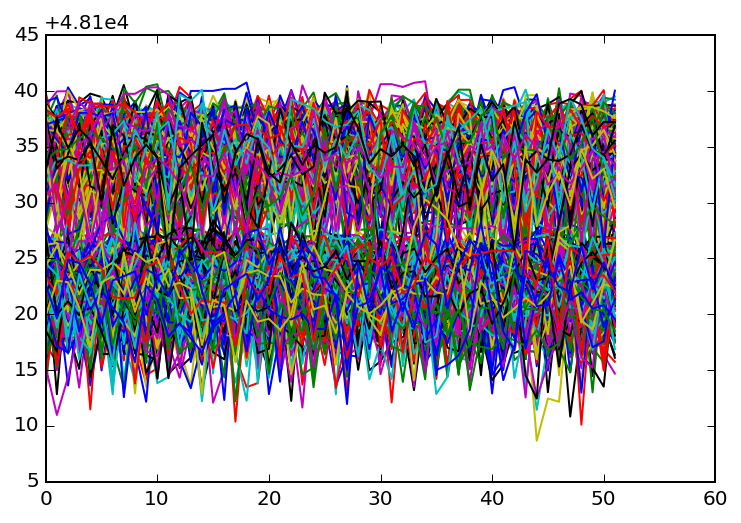

In [11]:
plot(runner.lnprobability.T); None

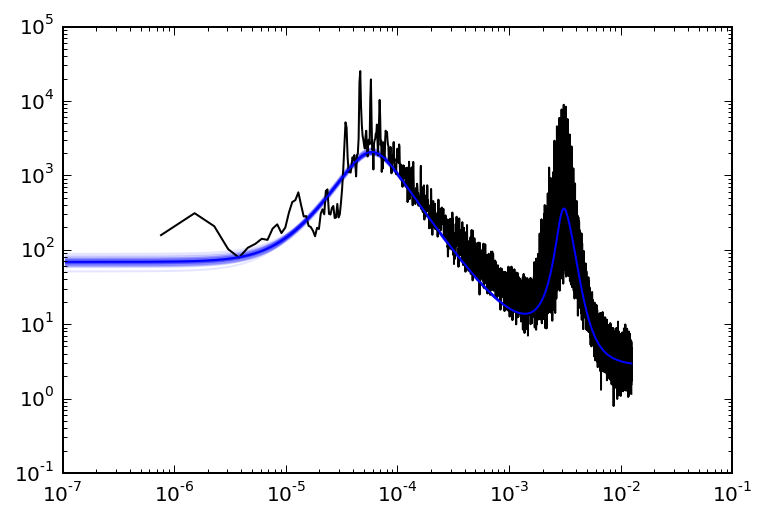

In [58]:
cp_psd = 0
logpost = runner.sampler.lnprobfn.f
cp_fs = exp(linspace(log(1.0/(logpost.T)), log(1.0/(2*dt)), 1000))
for p in runner.chain[:,-1,:]:
    pp = logpost.power_spectrum(cp_fs, p)
    wn = logpost.white_noise(p, cp_fs[-1])
    cp_psd += pp + wn
    if random.rand() < 0.1:
        loglog(cp_fs, pp + wn, '-b', alpha=0.1)
cp_psd /= runner.chain.shape[0]
loglog(fs, psd, '-k')
loglog(cp_fs, cp_psd, '-b')

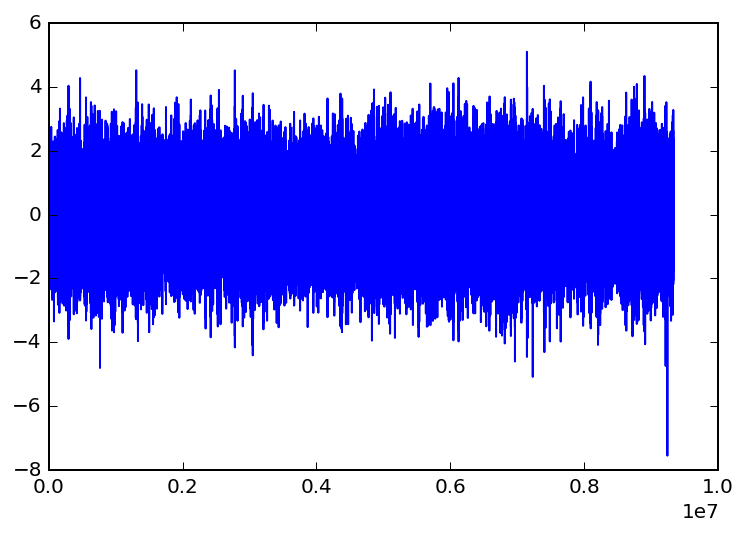

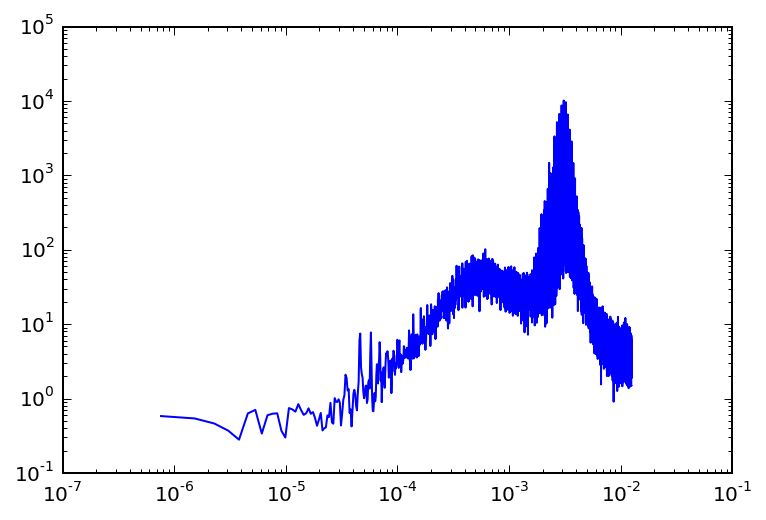

In [59]:
resid = 0
for p in runner.burnedin_chain[:,-1,:]:
    resid += logpost.residuals(p)[0]
resid /= runner.burnedin_chain.shape[0]
rdata = data.copy()
rdata[sel, 1] = resid
plot(rdata[:,0], rdata[:,1])
figure()
fs_resid, psd_resid = ss.welch(rdata[:,1], fs=1.0/dt, nperseg=nperseg)
loglog(fs_resid, psd_resid)

## Kombine

In [6]:
logpost = cpp.Posterior(data[sel, 0], data[sel, 1], data[sel, 2], p=6, q=5)

In [7]:
sampler = kombine.Sampler(2048, logpost.nparams, logpost)

In [8]:
p0 = runner.chain[:,-1,:]
result = sampler.burnin(p0=p0, test_steps=4)

KeyboardInterrupt: 

(0,)

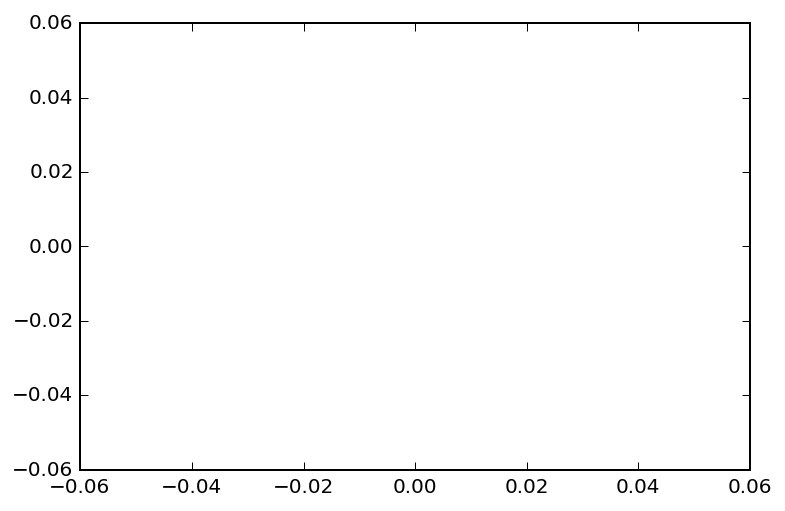

In [10]:
plot(sampler.acceptance_fraction)

In [59]:
p0 = sampler.chain[-1,:,:]

In [60]:
save('kombine-p0.npy', p0)

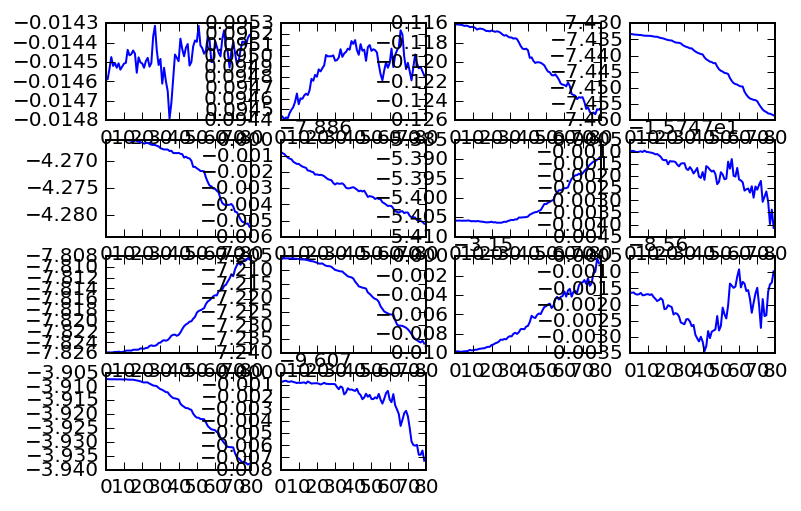

In [61]:
pu.plot_emcee_chains(sampler.chain.transpose((1,0,2)))

In [62]:
psds = []
wns = []
for p in sampler.chain[-1,:,:]:
    psds.append(logpost.power_spectrum(fs, p))
    wns.append(logpost.white_noise(p, fs[-1]))
psds = array(psds)
wns = array(wns)

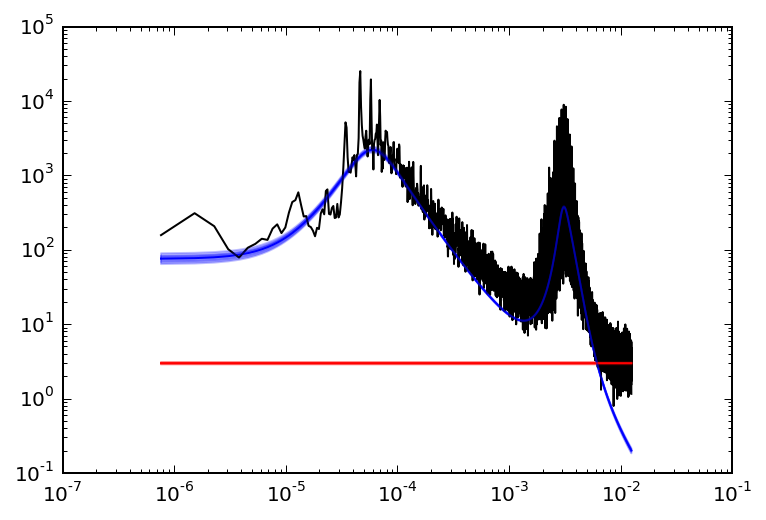

In [63]:
loglog(fs, median(psds, axis=0), '-b')
loglog(fs, psd, '-k')
fill_between(fs, percentile(psds, 84, axis=0), percentile(psds, 16, axis=0), color='b', alpha=0.25)
fill_between(fs, percentile(psds, 97.5, axis=0), percentile(psds, 2.5, axis=0), color='b', alpha=0.25)
loglog(fs, median(wns) + 0*fs, '-r')
fill_between(fs, percentile(wns, 84)+0*fs, percentile(wns, 16) + 0*fs, color='r', alpha=0.25)
fill_between(fs, percentile(wns, 97.5)+0*fs, percentile(wns, 2.5) + 0*fs, color='r', alpha=0.25)
for p in permutation(sampler.chain[-1,:,:])[:10]:
    loglog(fs, logpost.power_spectrum(fs, p), alpha=0.1, color='b')
    loglog(fs, logpost.white_noise(p, fs[-1]) + 0*fs, alpha=0.1, color='r')

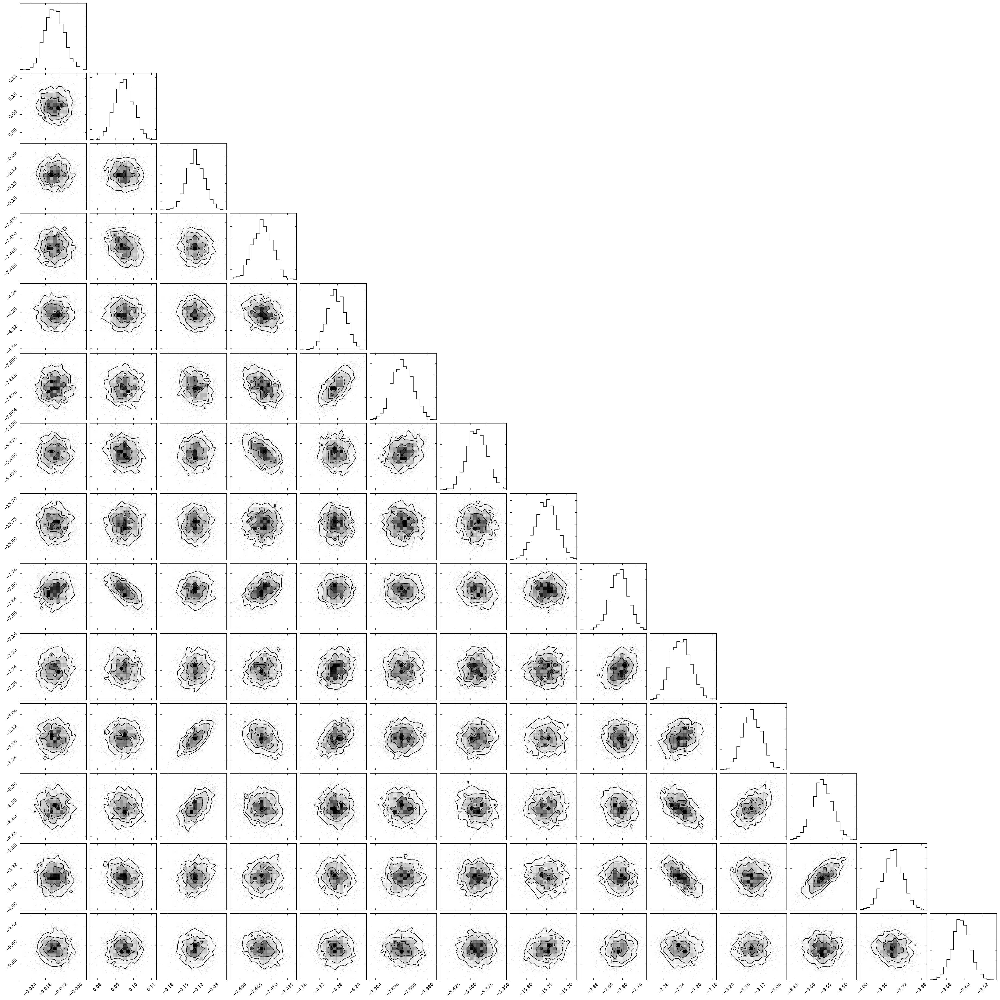

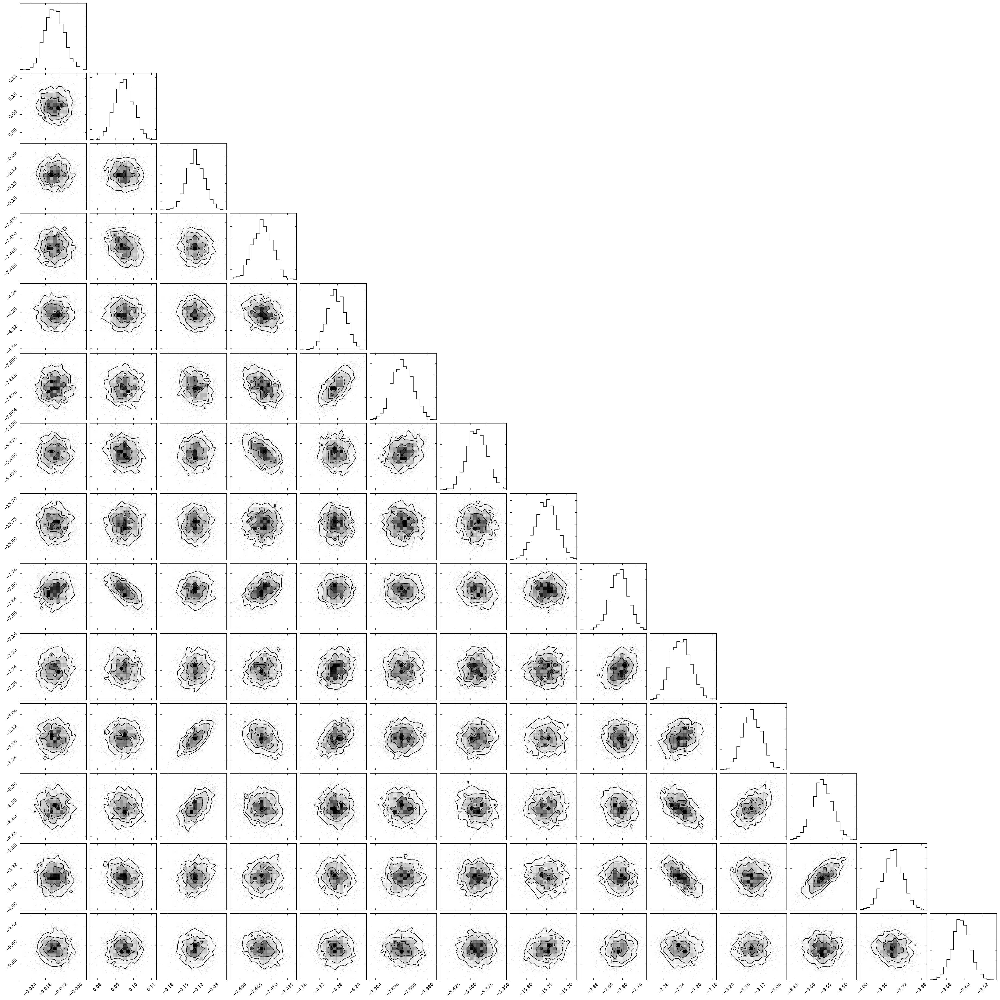

In [64]:
triangle.corner(sampler.chain[-1,:,:])

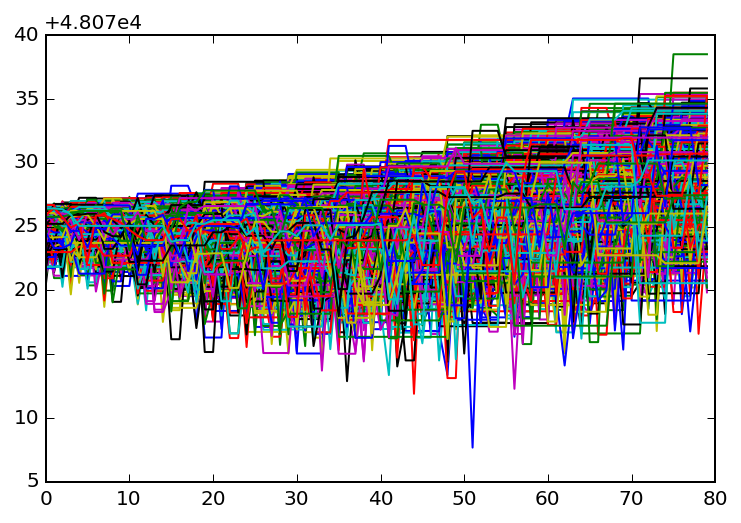

In [65]:
plot(sampler.lnpost); None

In [52]:
pbest = so.fmin_powell(lambda x: -logpost(x), pbest)

Optimization terminated successfully.
         Current function value: -48095.906225
         Iterations: 10
         Function evaluations: 1683


In [54]:
p0 = pbest + 1e-3*randn(2048, logpost.nparams)

## MultiNest

In [14]:
def to_xs(p):
    xs = [p[0]]
    for pp in p[1:]:
        xs.append(xs[-1] + pp*(1-xs[-1]))
    return np.array(xs)

In [19]:
def logit(x):
    return log(x) - log1p(-x)

In [21]:
to_xs(random.random(size=5))

array([ 0.8271179 ,  0.83206661,  0.85098847,  0.97614152,  0.99449437])